In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [2]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict


In [3]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [5]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [6]:
from pathlib import Path
from collections import defaultdict

# Define the directory where the JSON files are located
directory_path = Path("C:\\Users\\91837\\project\\archive\\train\\train")

# Find all JSON files with "post_" in their name
labels_generator = directory_path.rglob("*post_*.json")

def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

# Call the function to get the dictionary
disaster_dict = get_disaster_dict(labels_generator)

# Output the keys of the dictionary
print(disaster_dict.keys())


dict_keys(['guatemala-volcano', 'hurricane-florence', 'hurricane-harvey', 'hurricane-matthew', 'hurricane-michael', 'mexico-earthquake', 'midwest-flooding', 'palu-tsunami', 'santa-rosa-wildfire', 'socal-fire'])


In [7]:
# Select a particular disaster
disaster_labels = disaster_dict['mexico-earthquake']

In [8]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [9]:
# Color codes for polygons
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (255, 255, 0, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [10]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [11]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [12]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [13]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [14]:
len(disaster_labels)

121

In [15]:
disaster_labels[6]

'C:\\Users\\91837\\project\\archive\\train\\train\\labels\\mexico-earthquake_00000008_post_disaster.json'

mexico-earthquake_00000011_post_disaster.png


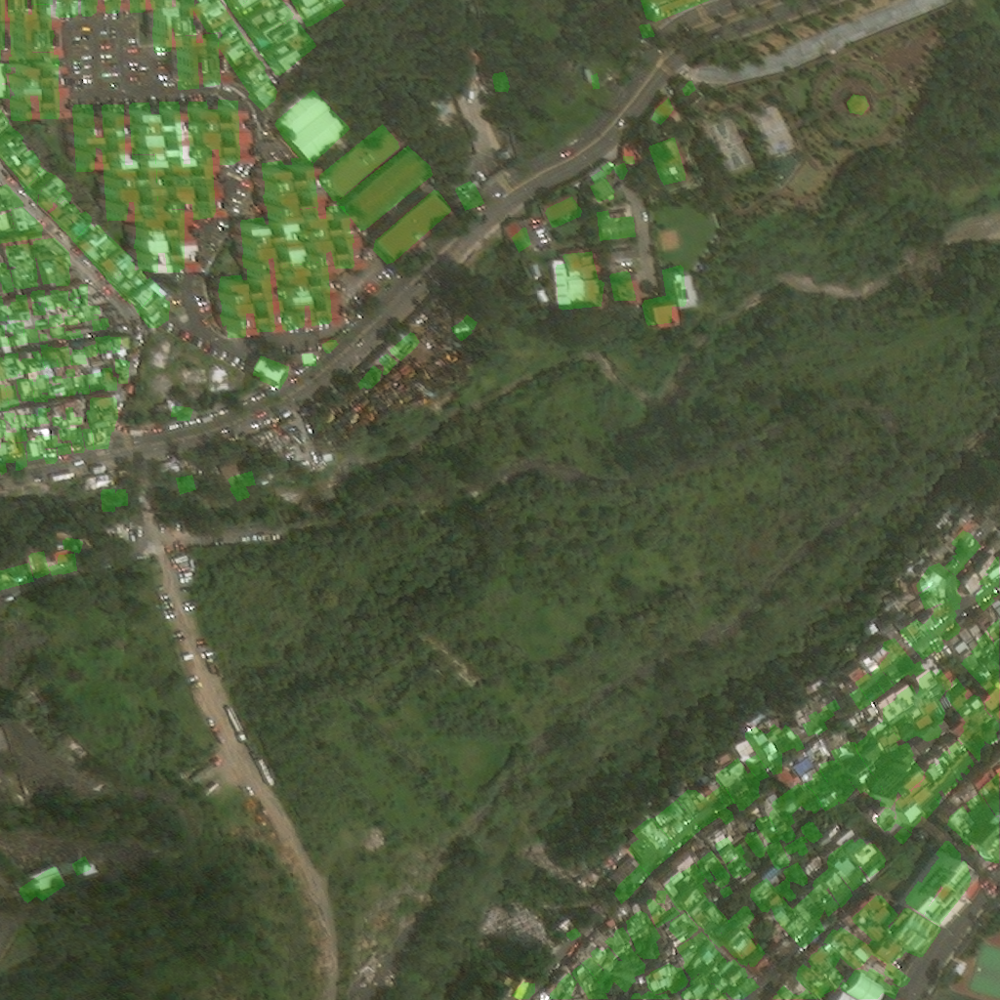

In [16]:
display_img(disaster_labels[8], time='post', annotated=True)

In [17]:
from shapely.geometry import Point, MultiPolygon
from shapely.wkt import loads as wkt_loads
from collections import Counter
import pandas as pd
import numpy as np

def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

def get_centroid(coords):
    polygons = [wkt_loads(polygon['wkt']) for polygon in coords]
    centroids = [polygon.centroid for polygon in polygons if polygon]
    
    if centroids:
        # Calculate the average centroid if there are valid centroids
        average_centroid = Point(sum(p.x for p in centroids) / len(centroids),
                                 sum(p.y for p in centroids) / len(centroids))
        return {'centroid_x': average_centroid.x, 'centroid_y': average_centroid.y, 'latlong': average_centroid}
    else:
        # Return None if no valid centroids are found
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None}

def get_damage_dict(coords):
    damage_list = [get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    
    return data['metadata']

def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    
    # Exclude non-numeric columns before calling fillna
    numeric_columns = df.select_dtypes(include=np.number).columns
    df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())
    
    return df

# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)


In [18]:
sorted_df

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,no-damage,minor-damage,un-classified,major-damage,destroyed
0,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000000_post_disaster.png,-99.226395,19.324802,POINT (-99.22639543409026 19.32480209911242),C:\Users\91837\project\archive\train\train\lab...,447.000000,2.0,5.357143,2.0,1.0
61,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000093_post_disaster.png,-99.208047,19.294366,POINT (-99.20804749162774 19.294365584295367),C:\Users\91837\project\archive\train\train\lab...,90.000000,4.4,5.357143,2.0,1.0
89,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000140_post_disaster.png,-99.226292,19.349870,POINT (-99.22629156396904 19.349870209397675),C:\Users\91837\project\archive\train\train\lab...,719.000000,4.4,5.357143,2.0,1.0
88,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000138_post_disaster.png,-99.169682,19.284466,POINT (-99.16968181104349 19.28446581853713),C:\Users\91837\project\archive\train\train\lab...,657.000000,4.4,5.357143,2.0,1.0
87,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000136_post_disaster.png,-99.170089,19.363689,POINT (-99.1700892347486 19.3636891764863),C:\Users\91837\project\archive\train\train\lab...,113.000000,4.4,5.357143,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000049_post_disaster.png,-99.151893,19.325243,POINT (-99.15189286674506 19.32524260798405),C:\Users\91837\project\archive\train\train\lab...,513.000000,1.0,5.357143,3.0,1.0
35,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000048_post_disaster.png,-99.183417,19.288788,POINT (-99.18341698874308 19.288787981065887),C:\Users\91837\project\archive\train\train\lab...,1148.000000,9.0,5.357143,2.0,1.0
34,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000047_post_disaster.png,-99.188999,19.279991,POINT (-99.18899866490351 19.279991400317606),C:\Users\91837\project\archive\train\train\lab...,248.000000,4.4,5.357143,2.0,1.0
33,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.53,68.674,105.50913,mexico-earthquake,...,mexico-earthquake_00000046_post_disaster.png,-99.192550,19.289922,POINT (-99.19254968189237 19.28992239327288),C:\Users\91837\project\archive\train\train\lab...,75.000000,4.4,5.357143,2.0,1.0


In [19]:
df_generator = sorted_df.iterrows()
index, row = next(df_generator)
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

no-damage           447.0
minor-damage          2.0
major-damage          2.0
destroyed             1.0
un-classified    5.357143
Name: 0, dtype: object

mexico-earthquake_00000000_pre_disaster.png


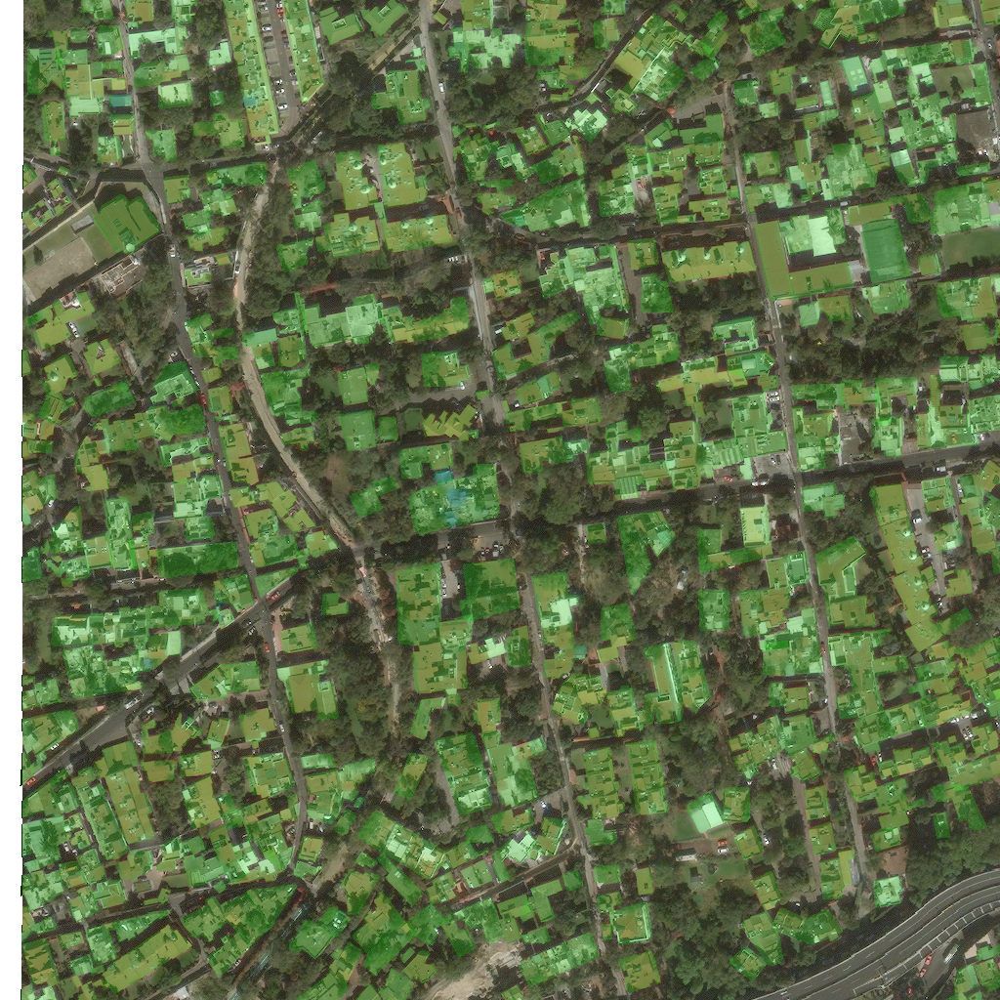

In [20]:
display_img(row.path, time='pre', annotated=True)

mexico-earthquake_00000000_post_disaster.png


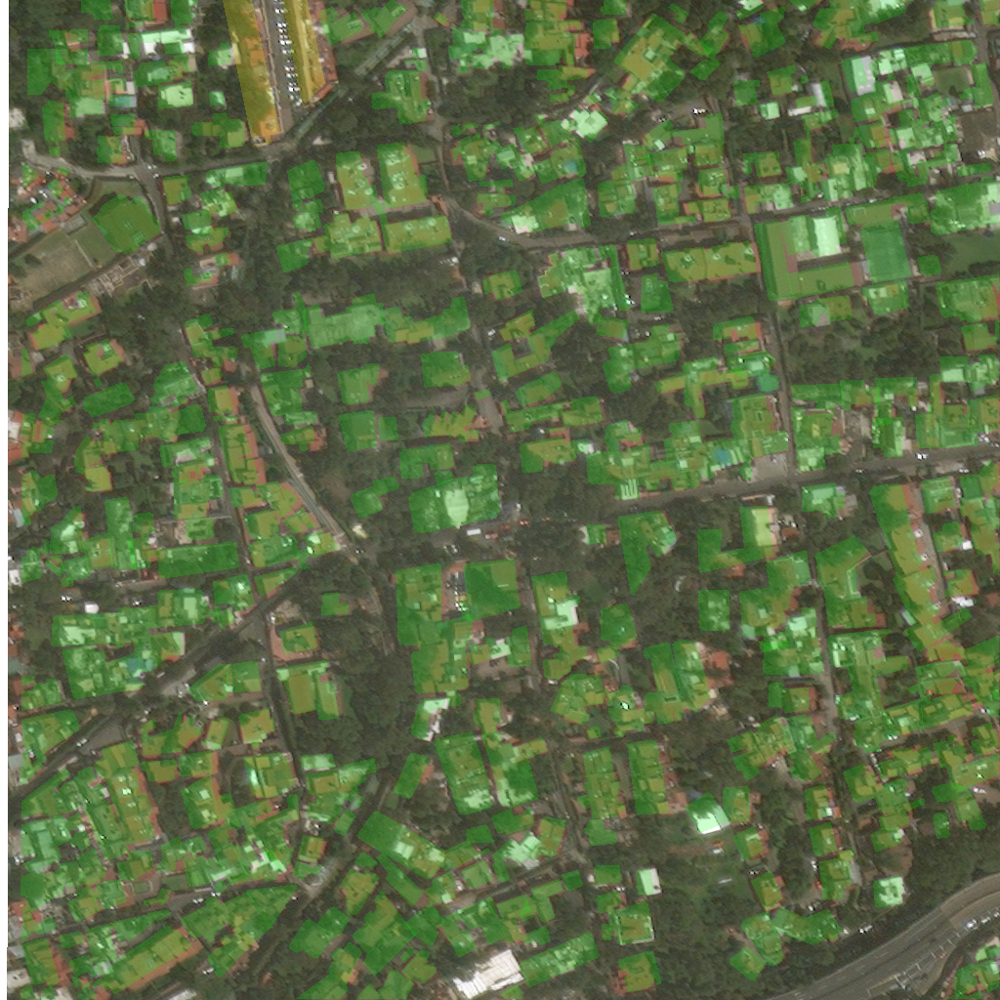

In [21]:
display_img(row.path, time='post', annotated=True)

mexico-earthquake_00000000_pre_disaster.png
mexico-earthquake_00000000_post_disaster.png
mexico-earthquake_00000000_pre_disaster.png
mexico-earthquake_00000000_post_disaster.png


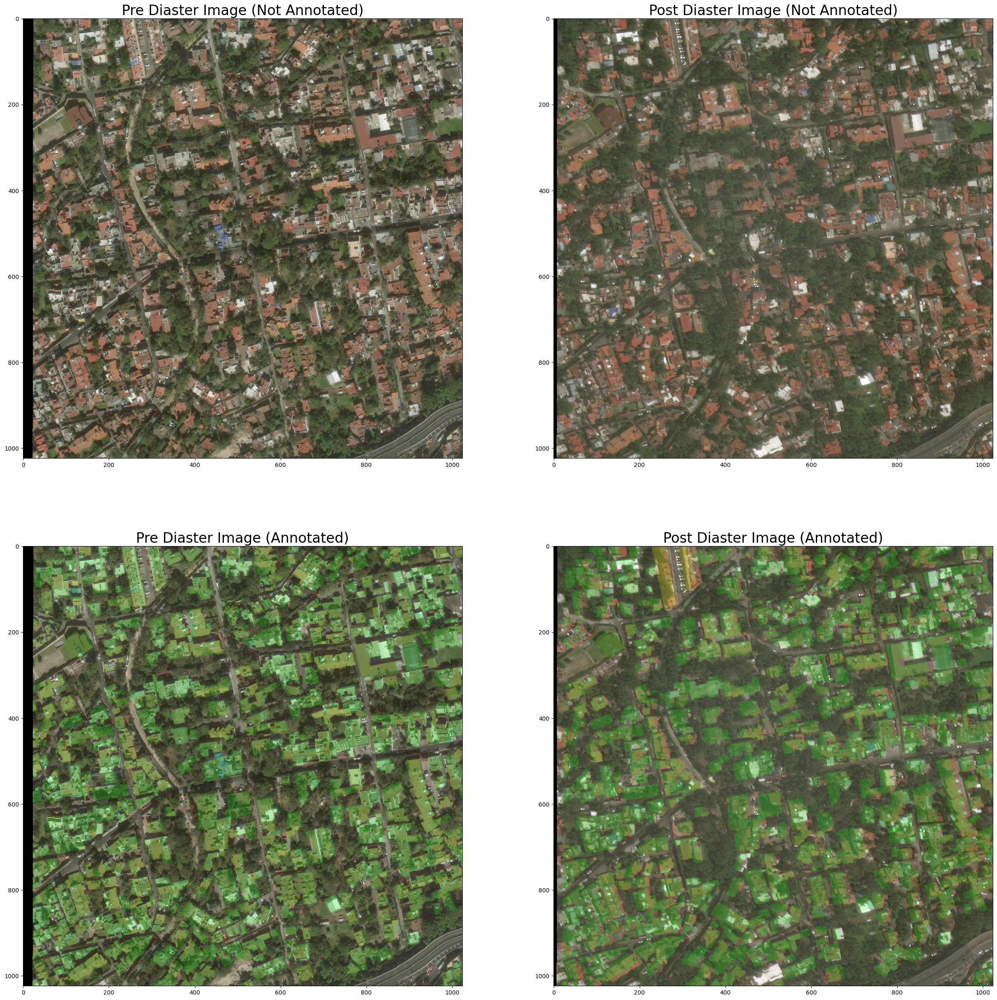

In [22]:
plot_image(row.path)

In [28]:
labels_generator = Path('C:\\Users\\91837\\project\\archive\\train\\train').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np  # For generating a range of colors

def plot_bargraph(df, x, y, agg_func):
    # Check if the columns exist in DataFrame
    if x not in df.columns or y not in df.columns:
        raise ValueError(f"Columns {x} and/or {y} not found in DataFrame.")
    
    # Group and aggregate data
    try:
        new_df = df.groupby(x, as_index=False).agg({y: agg_func})
    except Exception as e:
        raise ValueError(f"Error in aggregation: {e}")
    
    # Set up colors using a colormap
    colors = plt.cm.viridis(np.linspace(0, 1, len(new_df)))

    # Plotting
    plt.figure(figsize=(10, 6))  # Adjust the size as per your requirement
    for i, (label, row) in enumerate(new_df.iterrows()):
        plt.bar(row[x], row[y], color=colors[i], label=label)
    
    plt.xlabel(x, fontsize=12)
    plt.ylabel(y, fontsize=12)
    plt.title(f'{agg_func.capitalize()} of {y} by {x}', fontsize=16)
    plt.xticks(new_df[x], rotation=45)
    plt.legend(title=x, title_fontsize='13', fontsize='11')
    plt.grid(True)
    plt.show()


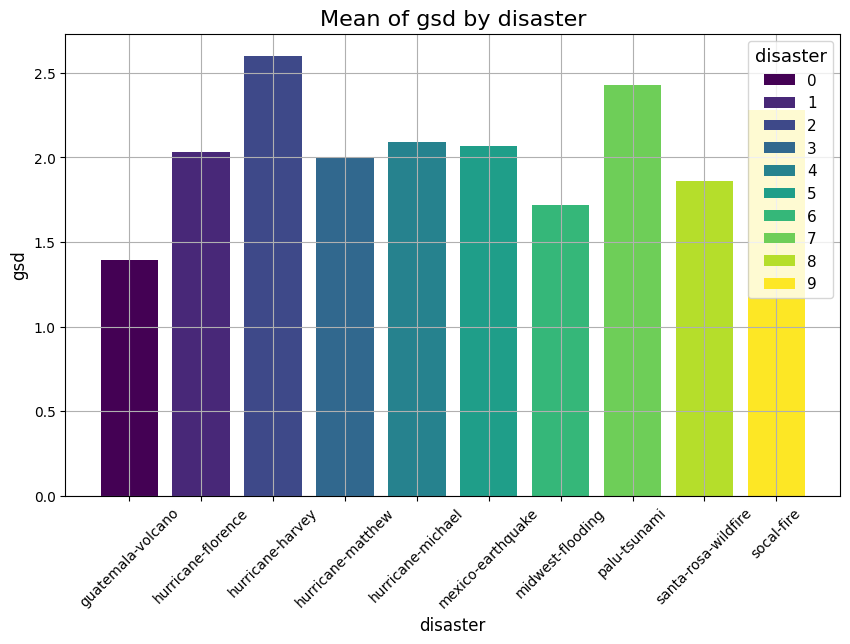

In [34]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean')

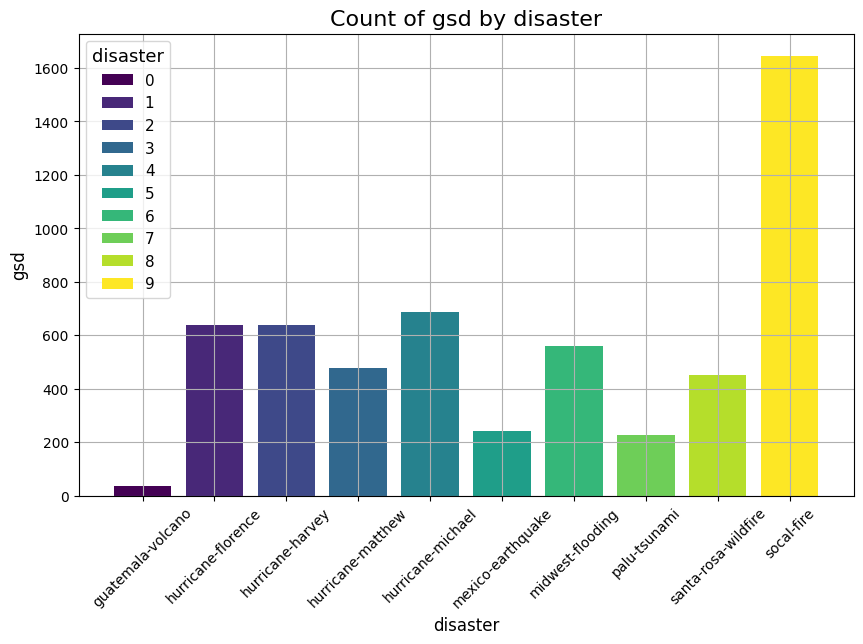

In [35]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count')

In [21]:
import numpy as np
import os
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Step 1: Data Loading
def load_data(image_dir, label_dir):
    # Load images
    images = []
    labels = []
    for image_file in os.listdir(image_dir):
        if image_file.endswith(".png"):
            image_path = os.path.join(image_dir, image_file)
            label_path = os.path.join(label_dir, image_file.replace(".png", ".json"))
            images.append(np.array(Image.open(image_path)))
            labels.append(label_path)
    return np.array(images), labels

# Specify directories for images and labels
image_dir = "C:/Users/91837/project/archive/train/train/images"
label_dir = "C:/Users/91837/project/archive/train/train/labels"

# Load images and corresponding labels
images, labels = load_data(image_dir, label_dir)

# Step 2: Annotation
def annotate_images(image_paths):
    annotated_images = []
    for image_path in image_paths:
        annotated_image = display_img(image_path, time='post', annotated=True)
        annotated_images.append(annotated_image)
    return annotated_images

annotated_images = annotate_images(labels)

# Step 3: Data Augmentation (if needed)

# Step 4: Data Splitting
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, random_state=42)
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size=0.2, random_state=42)

# Step 5: Data Preprocessing
# You may need to resize images to fit the input size of your U-Net model
# You may also need to preprocess labels to match the output format of your model

# Example preprocessing code (you may need to modify this based on your model's requirements)
def preprocess_images(images):
    # Resize images
    resized_images = [np.array(Image.fromarray(image).resize((desired_width, desired_height))) for image in images]
    # Normalize pixel values
    normalized_images = np.array(resized_images) / 255.0
    return normalized_images

def preprocess_labels(labels):
    categorical_label = to_categorical(labels)
    return categorical_label

# Preprocess training, validation, and test sets
# Step 5: Create Data Generators
batch_size = 32
train_generator = data_generator(train_images, train_labels, batch_size)
val_generator = data_generator(val_images, val_labels, batch_size)
test_generator = data_generator(test_images, test_labels, batch_size)
# Optionally, convert labels to categorical if needed
# train_labels = to_categorical(train_labels)
# val_labels = to_categorical(val_labels)
# test_labels = to_categorical(test_labels)

# Now, your dataset is ready for training the U-Net model


guatemala-volcano_00000000_post_disaster.png
guatemala-volcano_00000000_pre_disaster.png
guatemala-volcano_00000001_post_disaster.png
guatemala-volcano_00000001_pre_disaster.png
guatemala-volcano_00000002_post_disaster.png
guatemala-volcano_00000002_pre_disaster.png
guatemala-volcano_00000006_post_disaster.png
guatemala-volcano_00000006_pre_disaster.png
guatemala-volcano_00000007_post_disaster.png
guatemala-volcano_00000007_pre_disaster.png
guatemala-volcano_00000008_post_disaster.png
guatemala-volcano_00000008_pre_disaster.png
guatemala-volcano_00000010_post_disaster.png
guatemala-volcano_00000010_pre_disaster.png
guatemala-volcano_00000013_post_disaster.png
guatemala-volcano_00000013_pre_disaster.png
guatemala-volcano_00000015_post_disaster.png
guatemala-volcano_00000015_pre_disaster.png
guatemala-volcano_00000016_post_disaster.png
guatemala-volcano_00000016_pre_disaster.png
guatemala-volcano_00000017_post_disaster.png
guatemala-volcano_00000017_pre_disaster.png
guatemala-volcano_000

MemoryError: Unable to allocate 10.5 GiB for an array with shape (3582, 1024, 1024, 3) and data type uint8

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate

# Step 6: Model Selection (U-Net)
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    
    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder
    up6 = Conv2D(512, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv5))
    merge6 = Concatenate(axis=3)([conv4, up6])
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2D(256, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv6))
    merge7 = Concatenate(axis=3)([conv3, up7])
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2D(128, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv7))
    merge8 = Concatenate(axis=3)([conv2, up8])
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2D(64, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv8))
    merge9 = Concatenate(axis=3)([conv1, up9])
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Compile the model
model = unet(input_size=(256, 256, 3))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


In [ ]:
# Step 7: Train the Model
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_images) // batch_size,
    epochs=30,
    validation_data=val_generator,
    validation_steps=len(val_images) // batch_size
)
